In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.

In [39]:
def get_concat_h(img1,img2):
    dst=Image.new('RGB',(img1.width+img2.width,img1.height))
    dst.paste(img1,(0,0))
    dst.paste(img2,(img1.width,0))
    return dst

In [3]:
my_image="lenna.png"

Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's os module. The os module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory.

In [5]:
# to find the path
import os
cwd=os.getcwd()
cwd

'd:\\Numpy\\Machine Learning\\ComputerVision'

In [7]:
# the path to the image can be found using the following code
image_path=os.path.join(cwd,my_image)
image_path

'd:\\Numpy\\Machine Learning\\ComputerVision\\lenna.png'

In [9]:
from PIL import Image

In [10]:
image=Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

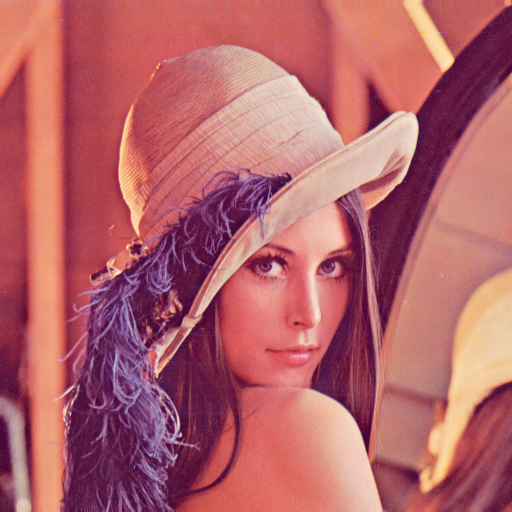

In [11]:
image

In [13]:
image.show()

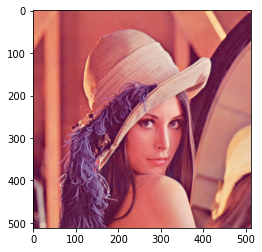

In [16]:
import matplotlib.pyplot as plt
plt.imshow(image)

You can also load the image using its full path. This comes in handy if the image is not in your working directory.

In [17]:
image=Image.open(image_path)
image.show()

The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.

In [19]:
print(image.size)

(512, 512)


This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.

In [20]:
print(image.mode)

RGB


The Image.open method does not load image data into the computer memory. The load method of PIL object reads the file content, decodes it, and expands the image into memory.

In [21]:
im=image.load()

We can then check the intensity of the image at the  𝑥 -th column and  𝑦 -th row:

In [22]:
x=0
y=1
print(im[y,x])

(226, 137, 125)


In [23]:
# You can save the image in jpg format using the following command.
image.save("lenna.jpg")

The ImageOps module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.

In [24]:
from PIL import ImageOps

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.

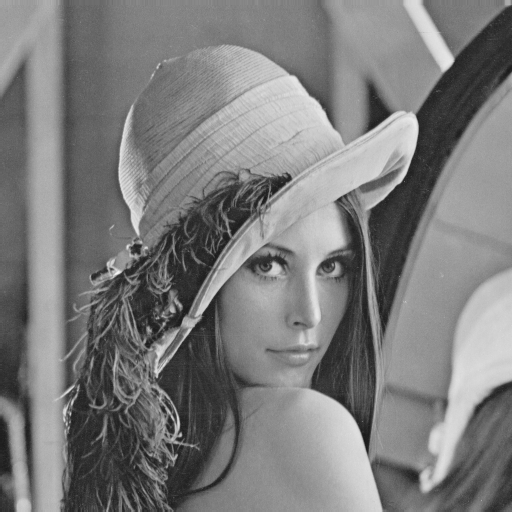

In [25]:
image_gray=ImageOps.grayscale(image)
image_gray

In [27]:
# the mode is L for grayscale
image_gray.mode

'L'

The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize. Let's repeatably cut the number of levels in half and observe what happens

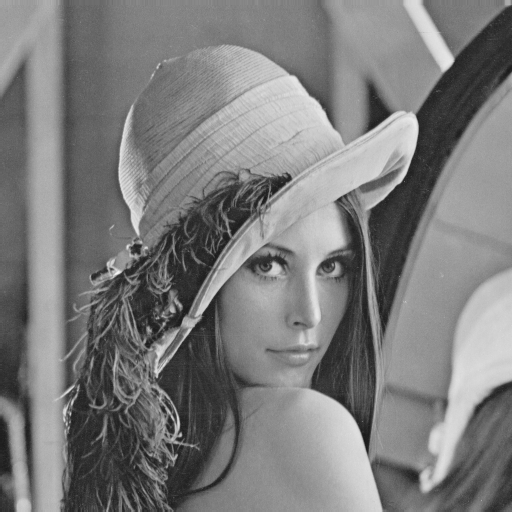

In [29]:
image_gray.quantize(256//2)
image_gray

We can also work with different color channels

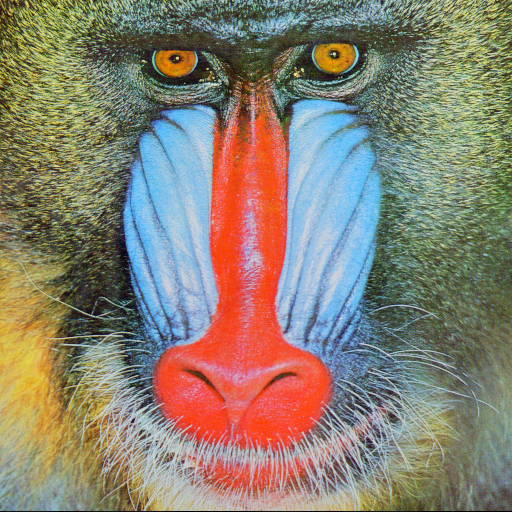

In [30]:
baboon=Image.open('baboon.png')
baboon

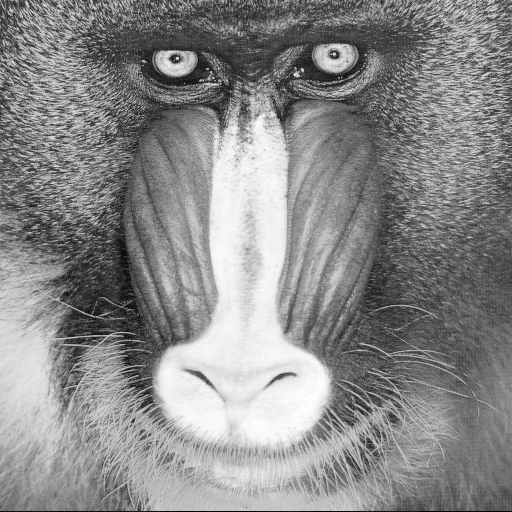

In [33]:
red,green,blue=baboon.split()
red

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.

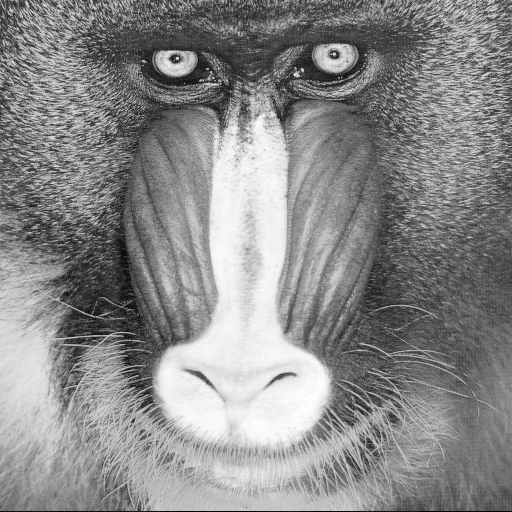

In [36]:
red

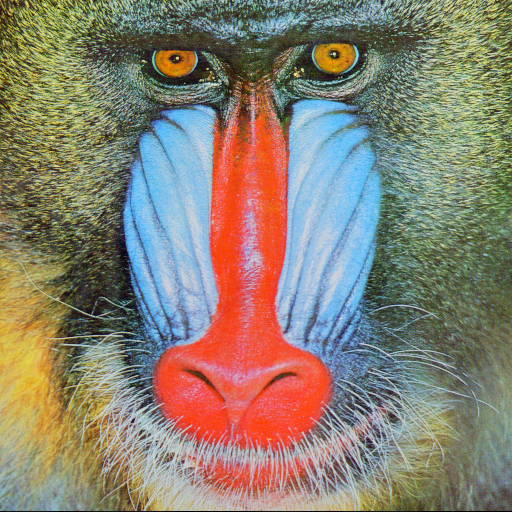

In [37]:
baboon

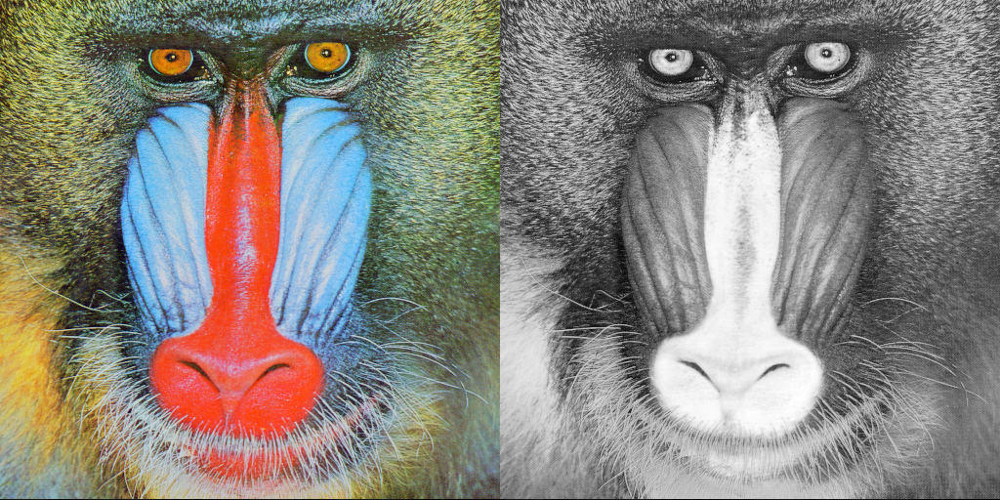

In [40]:
get_concat_h(baboon,red)

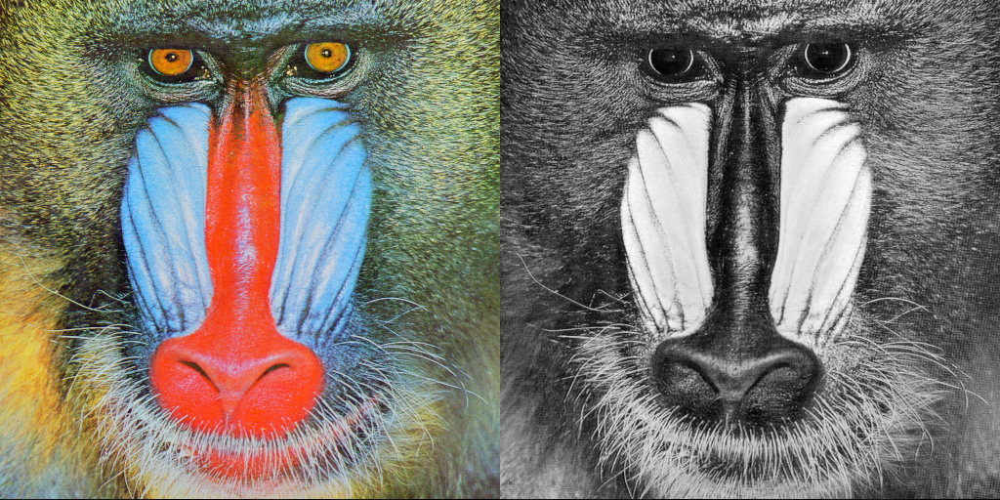

In [41]:
get_concat_h(baboon,blue)

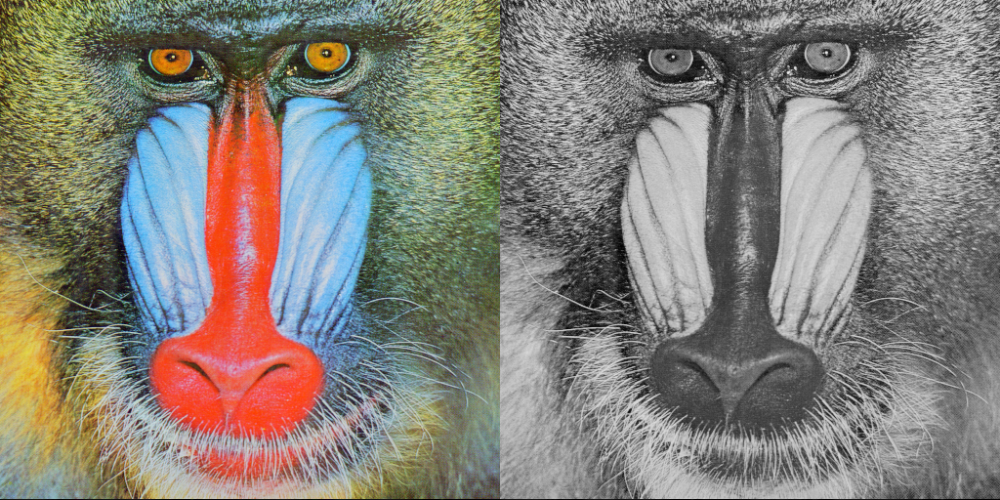

In [42]:
get_concat_h(baboon,green)

PIL into numpy arrays

In [43]:
import numpy as np

In [44]:
array=np.asarray(image)
array

array([[[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       ...,

       [[ 84,  18,  60],
        [ 84,  18,  60],
        [ 92,  27,  58],
        ...,
        [173,  73,  84],
        [172,  68,  76],
        [177,  62,  79]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]]

In [46]:
array.astype

<function ndarray.astype>

np.asarray turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The np.array method creates a new copy of the image, such that the original one will remain unmodified.



In [47]:
array=np.array(image)

In [48]:
type(array)

numpy.ndarray

In [49]:
array.shape

(512, 512, 3)

In [50]:
# the intensity value is a 8 bit signed datatype
array[0,0]

array([226, 137, 125], dtype=uint8)

In [52]:
print("array max: {} \n array min: {}".format(array.max(),array.min()))

array max: 255 
 array min: 3


you can plot the image using matplotlib

<function matplotlib.pyplot.show(close=None, block=None)>

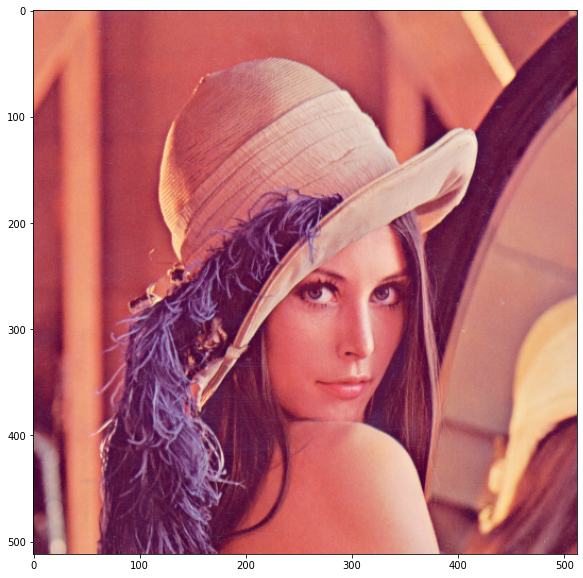

In [53]:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show

you can also use numpy slicing corresponding to the top half of the image

In [54]:
rows=256

<function matplotlib.pyplot.show(close=None, block=None)>

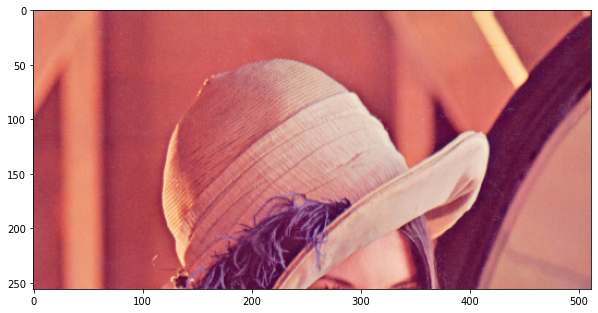

In [55]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,:])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

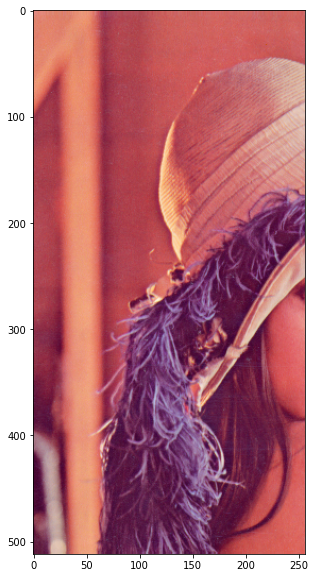

In [56]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:256,:])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

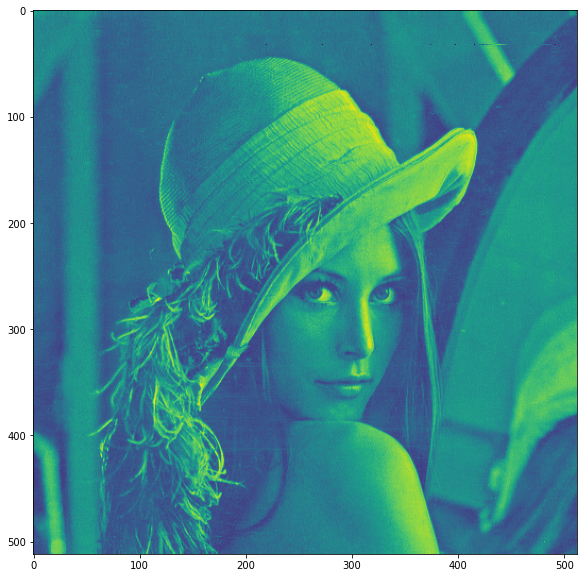

In [57]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,:,2])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

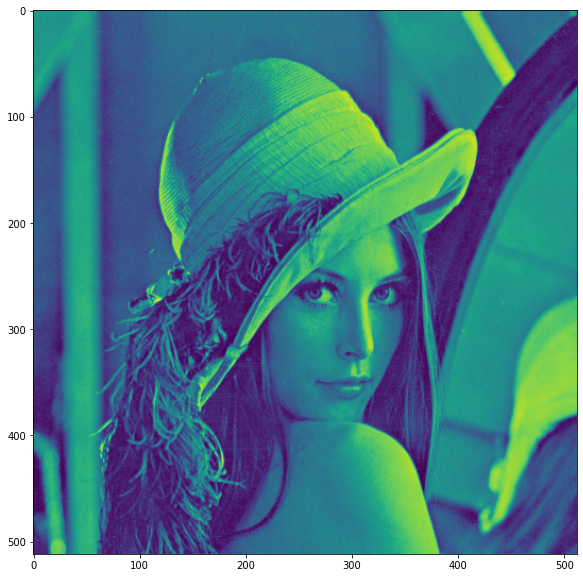

In [58]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,:,1])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

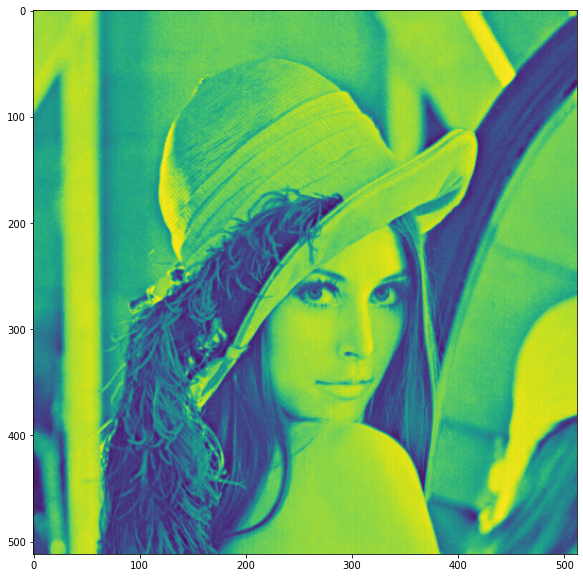

In [61]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,:,0])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

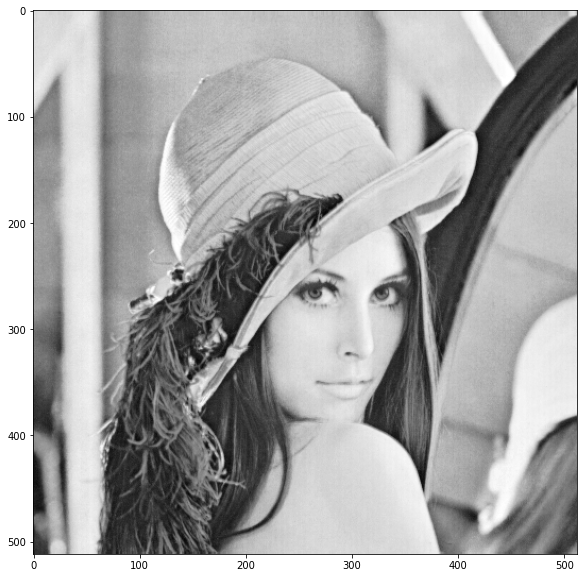

In [63]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,:,0],cmap='gray')
plt.show

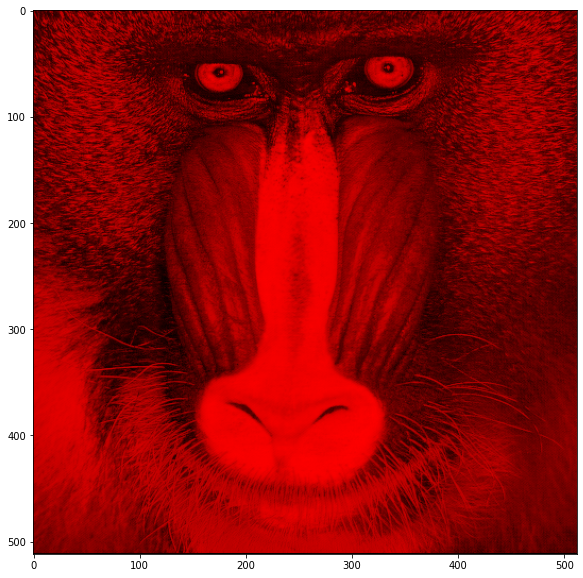

In [64]:
bab=np.array(baboon)
bab_red=bab.copy()
bab_red[:,:,1]=0
bab_red[:,:,2]=0
plt.figure(figsize=(10,10))
plt.imshow(bab_red)
plt.show()